In [7]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from siphon.catalog import TDSCatalog
import metpy.calc as mpcalc
from metpy.units import units
from scipy.ndimage import gaussian_filter
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import time as datetime

In [8]:
def load_datasets(year, month, start_day, start_hour=0, end_day=None, end_hour=23):
    # Set end_day to start_day if not provided
    if end_day is None:
        end_day = start_day
    
    # Get the last day of the month
    last_day_of_month = pd.Timestamp(year=year, month=month, day=1) + pd.offsets.MonthEnd(1)
    last_day_str = f"{last_day_of_month.day:02d}"  # format last day as two digits

    # Format date and time strings
    year_month = f'{year}{month:02d}'
    start_time = f'{year}{month:02d}{start_day:02d}{start_hour:02d}'  # yyyymmddhh (start)
    end_time = f'{year}{month:02d}{end_day:02d}{end_hour:02d}'  # yyyymmddhh (end)

    # Define URLs for pressure level datasets with specific time ranges
    urls = {
        'temperature_pl': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/{year_month}/e5.oper.an.pl.128_130_t.ll025sc.{start_time}_{end_time}.nc',
        'geopotential_pl': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/{year_month}/e5.oper.an.pl.128_129_z.ll025sc.{start_time}_{end_time}.nc',
        'humidity_pl': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/{year_month}/e5.oper.an.pl.128_133_q.ll025sc.{start_time}_{end_time}.nc',
        'v_wind_pl': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/{year_month}/e5.oper.an.pl.128_132_v.ll025uv.{start_time}_{end_time}.nc',
        'u_wind_pl': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/{year_month}/e5.oper.an.pl.128_131_u.ll025uv.{start_time}_{end_time}.nc',
        'w_wind_pl': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/{year_month}/e5.oper.an.pl.128_135_w.ll025sc.{start_time}_{end_time}.nc',
        'pv_pl': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/{year_month}/e5.oper.an.pl.128_060_pv.ll025sc.{start_time}_{end_time}.nc',
        
        # Define URLs for surface datasets to cover the full month using last_day_of_month
        'mslp_sfc': f'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/{year_month}/catalog.html?dataset=files/g/d633000/e5.oper.an.sfc/{year_month}/e5.oper.an.sfc.128_151_msl.ll025sc.{year_month}0100_{year_month}{last_day_str}23.nc'}

    # Initialize empty dictionaries for datasets
    datasets = {}

    # Try to load datasets from the URLs
    for var, url in urls.items():
        try:
            tds_catalog = TDSCatalog(url)
            ds_url = tds_catalog.datasets[0].access_urls['OPENDAP']
            ds = xr.open_dataset(ds_url).metpy.parse_cf()
            datasets[var] = ds
            print("="*50)
            print(f"Successfully loaded {var}")
            print("="*50)

        except Exception as e:
            print("="*50)
            print(f"Error loading {var}: {e}")
            print("="*50)

    # Merge pressure level datasets if available
    ds_pl, ds_sfc, ds_lsm = None, None, None

    try:
        ds_pl = xr.merge([datasets['temperature_pl'], datasets['geopotential_pl'], datasets['humidity_pl'], 
                        datasets['v_wind_pl'], datasets['u_wind_pl'], datasets['w_wind_pl'], datasets['pv_pl']])
        print("="*50)
        print("Successfully merged pressure level datasets")
        print("="*50)
    except KeyError as e:
        print("="*50)
        print(f"Error merging pressure level datasets: {e}")
        print("="*50)

    # Merge surface datasets if available
    try:
        ds_sfc = xr.merge([datasets['mslp_sfc']])
        print("="*50)
        print("Successfully merged surface datasets")
        print("="*50)
    except KeyError as e:
        print("="*50)
        print(f"Error merging surface datasets: {e}")
        print("="*50)

    # Load the land-sea mask
    try:
        lsm_url = 'https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.invariant/197901/catalog.html?dataset=files/g/d633000/e5.oper.invariant/197901/e5.oper.invariant.128_172_lsm.ll025sc.1979010100_1979010100.nc'
        tds_catalog = TDSCatalog(lsm_url)
        ds_url = tds_catalog.datasets[0].access_urls['OPENDAP']
        ds = xr.open_dataset(ds_url).metpy.parse_cf()
        ds_lsm = ds['LSM'].isel(time=0)
        print("="*50)
        print("Successfully loaded land-sea mask")
        print("="*50)
    except Exception as e:
        print("="*50)
        print(f"Error loading land-sea mask: {e}")
        print("="*50)

    # Synchronize time dimensions
    try:
        if ds_pl is not None and ds_sfc is not None:
            first_time_pl, last_time_pl = ds_pl['time'].min().values, ds_pl['time'].max().values
            ds_sfc = ds_sfc.sel(time=slice(first_time_pl, last_time_pl))
    except KeyError as e:
        print("="*50)
        print(f"Error accessing 'time' in the datasets: {e}")
        print("="*50)
    except Exception as e:
        print("="*50)
        print(f"An error occurred during slicing: {e}")
        print("="*50)
        
    return ds_pl, ds_sfc, ds_lsm


def base_plot(directions):
    fig, ax = plt.subplots(figsize=(12, 9), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.set_extent([directions['West'], directions['East'], directions['South'], directions['North']-5])
    ax.add_feature(cfeature.STATES.with_scale('50m'), edgecolor='gray', linewidth=0.5)
    ax.add_feature(cfeature.COASTLINE.with_scale('10m'), linewidth=0.5)
    ax.add_feature(cfeature.OCEAN, color='white')
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    ax.add_feature(cfeature.LAND, color='#fbf5e9')
    
    # Add gridlines and format longitude/latitude labels
    gls = ax.gridlines(draw_labels=True, color='black', linestyle='--', alpha=0.35)
    gls.top_labels = False
    gls.right_labels = False
    lon_formatter = LongitudeFormatter(zero_direction_label=True)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
    
    return fig, ax

def plot_ivt(ds_pl, ds_sfc, directions, g, ds_lsm): 
    ds_pl_sliced = ds_pl.sel(latitude=slice(directions['North'], directions['South']), longitude=slice(directions['West'], directions['East']))
    ds_sfc_sliced = ds_sfc.sel(latitude=slice(directions['North'], directions['South']), longitude=slice(directions['West'], directions['East']))
    
    for i in range(0, len(ds_pl_sliced.time)):
        iteration_start = datetime.time()
        # Loop over the time dimension
        ds_pl_time_sliced = ds_pl_sliced.isel(time=i)
        ds_sfc_time_sliced = ds_sfc_sliced.isel(time=i)

        # Slice the dataset to get the data for the pressure levels between 300 and 1000 hPa
        u_sliced = ds_pl_time_sliced['U'].sel(level=slice(300, 1000)) # units: m/s
        v_sliced = ds_pl_time_sliced['V'].sel(level=slice(300, 1000)) # units: m/s
        q_sliced = ds_pl_time_sliced['Q'].sel(level=slice(300, 1000)) # units: kg/kg
        mslp = ds_sfc_time_sliced['MSL'] / 100 # units: hPa

        # Flip the order of the pressure levels and convert them to Pa from hPa
        pressure_levels = u_sliced['level'][::-1] * 100 * units.Pa # units: Pa

        # Get the time of the current time step and create a pandas DatetimeIndex
        time = ds_pl_time_sliced.time.values
        int_datetime_index = pd.DatetimeIndex([time])
        
        lats, lons = ds_pl_time_sliced['latitude'].metpy.unit_array, ds_pl_time_sliced['longitude'].metpy.unit_array

        # Calculate the integrated vapor transport (IVT) using the u- and v-wind components and the specific humidity
        u_ivt = -1 / g * np.trapz(u_sliced * q_sliced, pressure_levels, axis=0)
        v_ivt = -1 / g * np.trapz(v_sliced * q_sliced, pressure_levels, axis=0)

        # Calculate the IVT magnitude
        ivt = np.sqrt(u_ivt**2 + v_ivt**2)

        # Create an xarray DataArray for the IVT
        ivt_da = xr.DataArray(ivt, dims=['latitude', 'longitude'], coords={'latitude': u_sliced['latitude'], 'longitude': u_sliced['longitude']})

        # Define the color levels and colors for the IVT plot
        levels = [250, 300, 400, 500, 600, 700, 800, 1000, 1200, 1400, 1600, 1800]
        colors = ['#ffff00', '#ffe400', '#ffc800', '#ffad00', '#ff8200', '#ff5000', '#ff1e00', '#eb0010', '#b8003a', '#850063', '#570088']
        cmap = mcolors.ListedColormap(colors)
        norm = mcolors.BoundaryNorm(levels, cmap.N)

        # Get the time of the current time step and create a pandas DatetimeIndex
        time = ds_pl_time_sliced.time.values
        int_datetime_index = pd.DatetimeIndex([time])

        # Smooth the data
        ivt_smoothed = gaussian_filter(ivt_da, sigma=1)
        u_ivt_smoothed = gaussian_filter(u_ivt, sigma=1)
        v_ivt_smoothed = gaussian_filter(v_ivt, sigma=1)
        mslp_smoothed = gaussian_filter(mslp, sigma=1)

        # Mask the IVT values below 250 kg/m/s and create a filtered DataArray for the u- and v-wind components
        mask = ivt_da >= 250
        u_ivt_filtered = xr.DataArray(u_ivt, dims=['latitude', 'longitude'], coords={'latitude': u_sliced['latitude'], 'longitude': u_sliced['longitude']}).where(mask, drop=True)
        v_ivt_filtered = xr.DataArray(v_ivt, dims=['latitude', 'longitude'], coords={'latitude': u_sliced['latitude'], 'longitude': u_sliced['longitude']}).where(mask, drop=True)

        # Plot
        fig, ax = base_plot(directions)
        plt.contour(lons, lats, ivt_smoothed, colors='black', levels=levels, linewidths=0.5)
        cf = ax.contourf(lons, lats, ivt_smoothed, levels=levels, cmap=cmap, norm=norm, extend='max', transform=ccrs.PlateCarree())
        plt.colorbar(cf, orientation='horizontal', label="IVT (kg/m/s)", pad=0.05, aspect=50)
        isobars = plt.contour(lons, lats, mslp_smoothed, colors='black', levels=np.arange(960, 1080, 4), linewidths=1)
        try:
            plt.clabel(isobars, inline=True, inline_spacing=5, fontsize=10, fmt='%i')
        except IndexError:
            print("No contours to label for isobars.")
        step = 5 
        plt.quiver(u_ivt_filtered['longitude'].values[::step], u_ivt_filtered['latitude'].values[::step], u_ivt_filtered.values[::step, ::step], v_ivt_filtered.values[::step, ::step], scale=500, scale_units='xy', color='black')
        
        mslp_line = plt.Line2D([0], [0], color='black', linewidth=1, label='MSLP (hPa)')
        ax.legend(handles=[mslp_line], loc='upper right')
    
        
        plt.title(f'ERA5 Reanalysis Integrated Water Vapor Transport (IVT) | {int_datetime_index[0].strftime("%Y-%m-%d %H00 UTC")}', fontsize=14, weight='bold')
        plt.tight_layout()
        plt.show()

        iteration_end = datetime.time()
        print("="*50)
        print(f"Time taken for iteration {i}: {iteration_end - iteration_start:.2f} seconds")
        print("="*50)

Loading datasets...


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/202303/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/202303/e5.oper.an.pl.128_130_t.ll025sc.2023031400_2023031423.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/202303/catalog.xml?dataset=files/g/d633000/e5.oper.an.pl/202303/e5.oper.an.pl.128_130_t.ll025sc.2023031400_2023031423.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded temperature_pl


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/202303/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/202303/e5.oper.an.pl.128_129_z.ll025sc.2023031400_2023031423.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/202303/catalog.xml?dataset=files/g/d633000/e5.oper.an.pl/202303/e5.oper.an.pl.128_129_z.ll025sc.2023031400_2023031423.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded geopotential_pl


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/202303/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/202303/e5.oper.an.pl.128_133_q.ll025sc.2023031400_2023031423.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/202303/catalog.xml?dataset=files/g/d633000/e5.oper.an.pl/202303/e5.oper.an.pl.128_133_q.ll025sc.2023031400_2023031423.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded humidity_pl


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/202303/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/202303/e5.oper.an.pl.128_132_v.ll025uv.2023031400_2023031423.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/202303/catalog.xml?dataset=files/g/d633000/e5.oper.an.pl/202303/e5.oper.an.pl.128_132_v.ll025uv.2023031400_2023031423.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded v_wind_pl


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/202303/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/202303/e5.oper.an.pl.128_131_u.ll025uv.2023031400_2023031423.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/202303/catalog.xml?dataset=files/g/d633000/e5.oper.an.pl/202303/e5.oper.an.pl.128_131_u.ll025uv.2023031400_2023031423.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded u_wind_pl


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/202303/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/202303/e5.oper.an.pl.128_135_w.ll025sc.2023031400_2023031423.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/202303/catalog.xml?dataset=files/g/d633000/e5.oper.an.pl/202303/e5.oper.an.pl.128_135_w.ll025sc.2023031400_2023031423.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded w_wind_pl


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/202303/catalog.html?dataset=files/g/d633000/e5.oper.an.pl/202303/e5.oper.an.pl.128_060_pv.ll025sc.2023031400_2023031423.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.pl/202303/catalog.xml?dataset=files/g/d633000/e5.oper.an.pl/202303/e5.oper.an.pl.128_060_pv.ll025sc.2023031400_2023031423.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded pv_pl


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/202303/catalog.html?dataset=files/g/d633000/e5.oper.an.sfc/202303/e5.oper.an.sfc.128_151_msl.ll025sc.2023030100_2023033123.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.an.sfc/202303/catalog.xml?dataset=files/g/d633000/e5.oper.an.sfc/202303/e5.oper.an.sfc.128_151_msl.ll025sc.2023030100_2023033123.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded mslp_sfc
Successfully merged pressure level datasets
Successfully merged surface datasets


C:\Users\Tony\anaconda3\lib\site-packages\siphon\catalog.py:292: UserWarning: URL https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.invariant/197901/catalog.html?dataset=files/g/d633000/e5.oper.invariant/197901/e5.oper.invariant.128_172_lsm.ll025sc.1979010100_1979010100.nc returned HTML. Changing to: https://thredds.rda.ucar.edu/thredds/catalog/files/g/d633000/e5.oper.invariant/197901/catalog.xml?dataset=files/g/d633000/e5.oper.invariant/197901/e5.oper.invariant.128_172_lsm.ll025sc.1979010100_1979010100.nc
  warnings.warn('URL {} returned HTML. Changing to: {}'.format(self.catalog_url,


Successfully loaded land-sea mask
Datasets loaded successfully.
Plotting IVT...


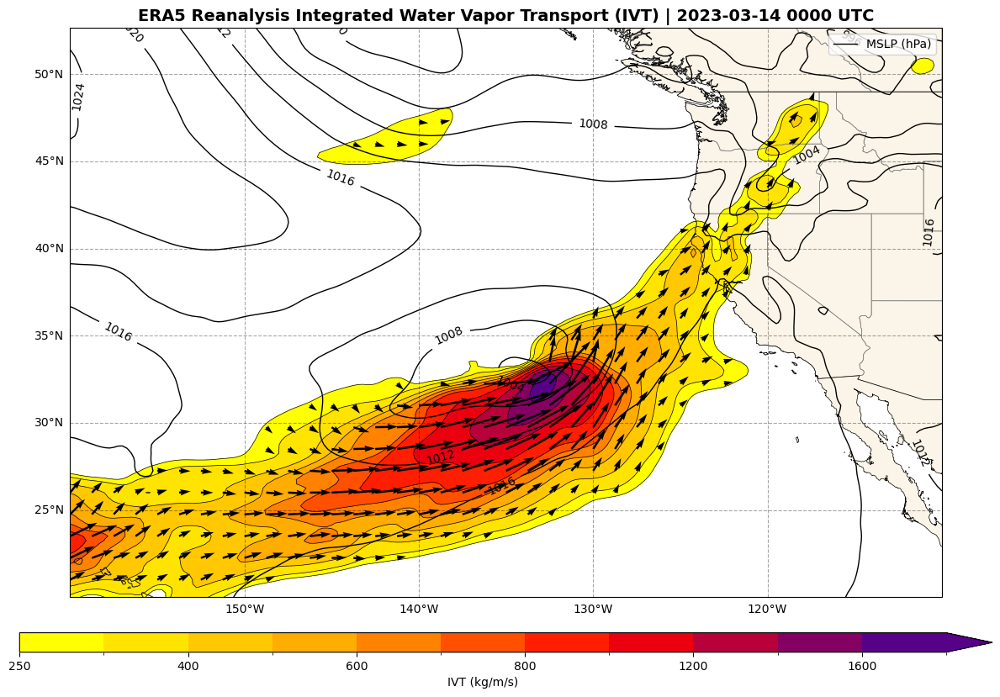

Time taken for iteration 0: 9.26 seconds


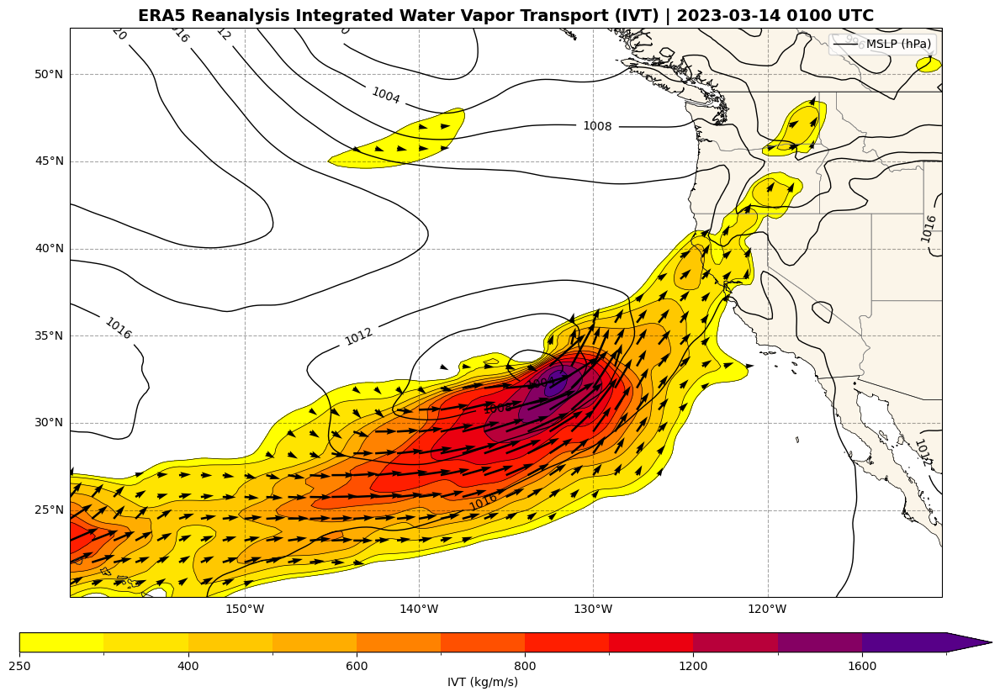

Time taken for iteration 1: 9.10 seconds


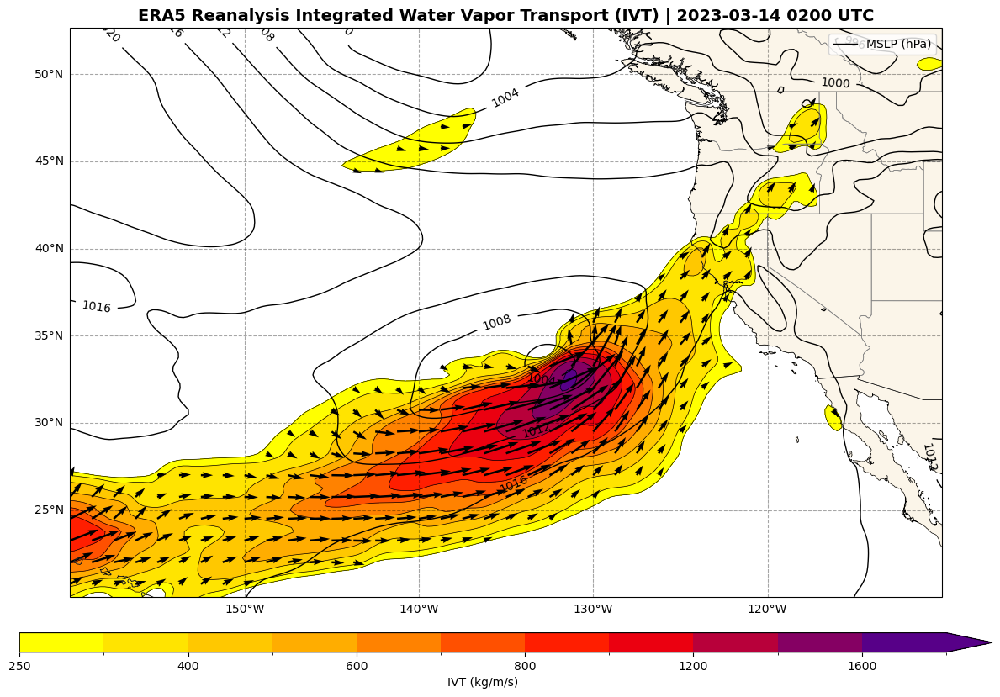

Time taken for iteration 2: 9.82 seconds


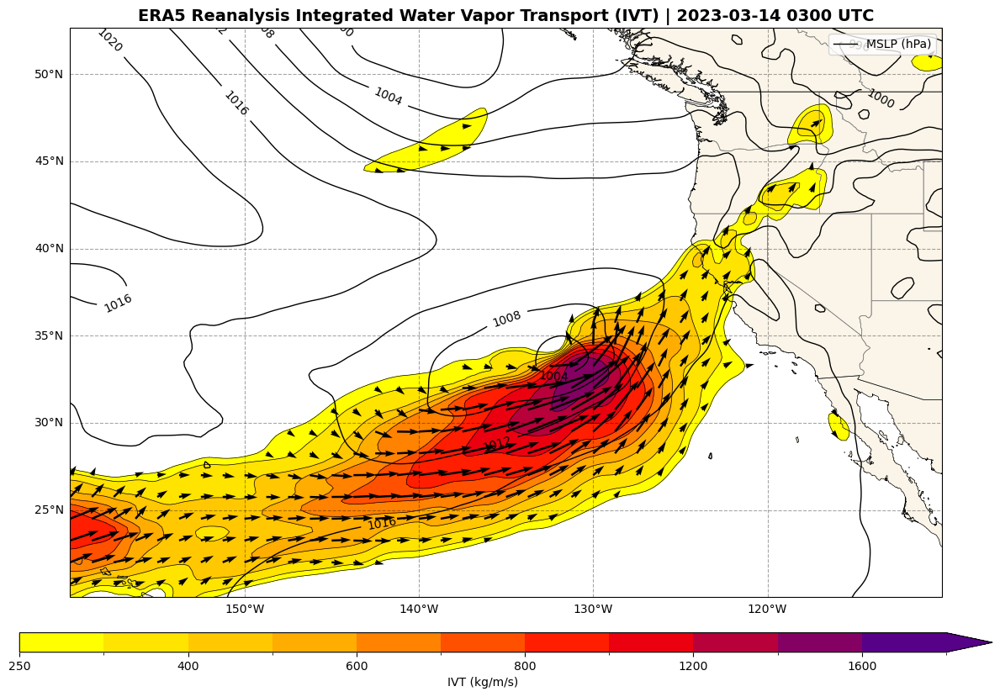

Time taken for iteration 3: 9.75 seconds


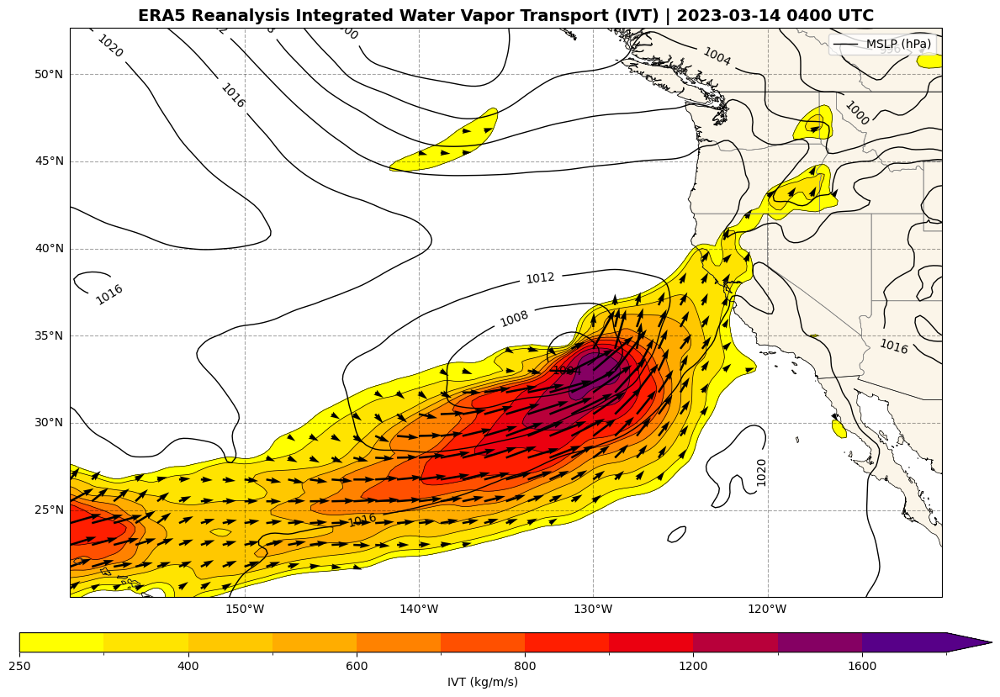

Time taken for iteration 4: 10.53 seconds


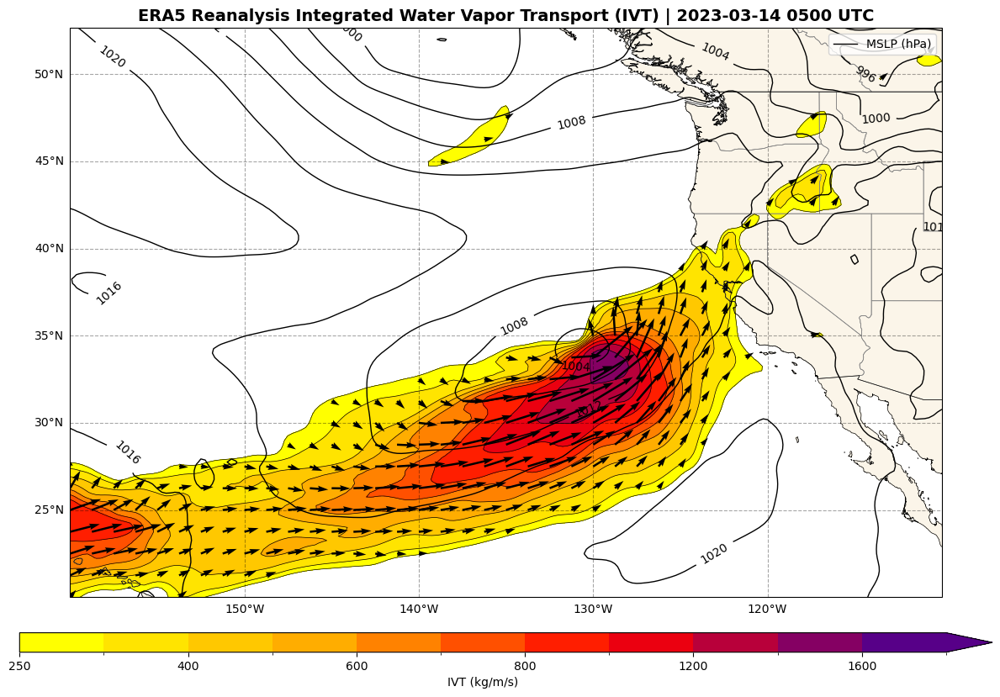

Time taken for iteration 5: 11.27 seconds


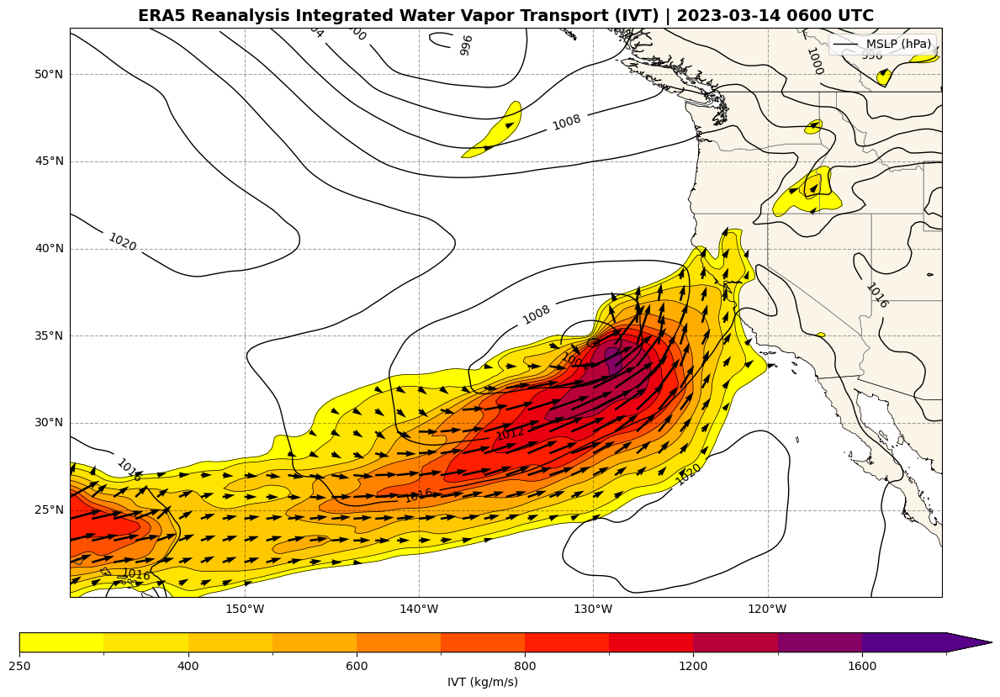

Time taken for iteration 6: 11.50 seconds


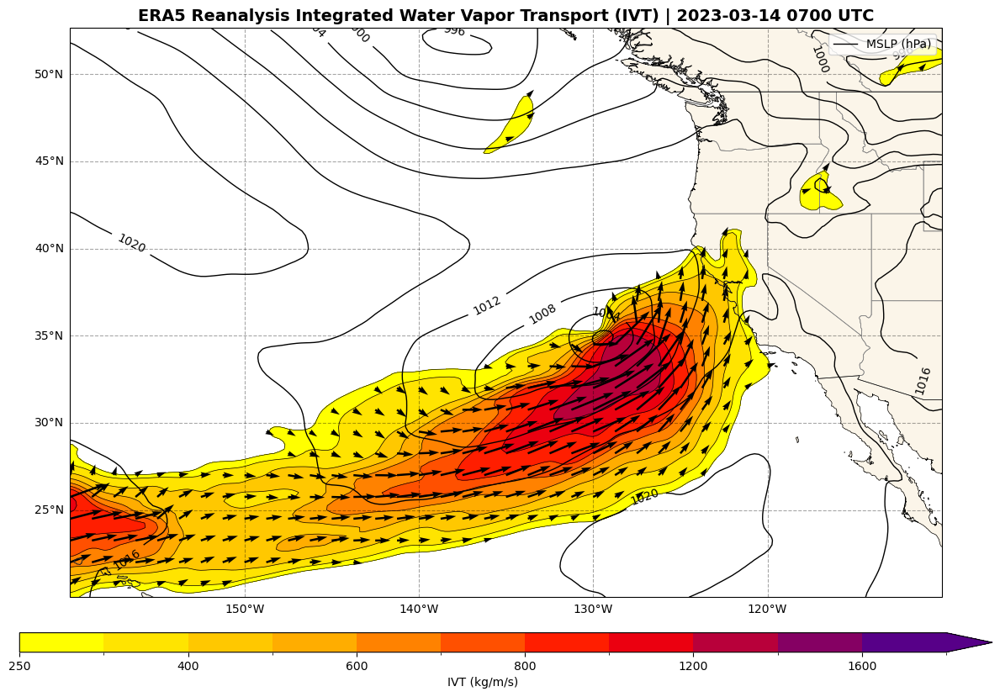

Time taken for iteration 7: 11.77 seconds


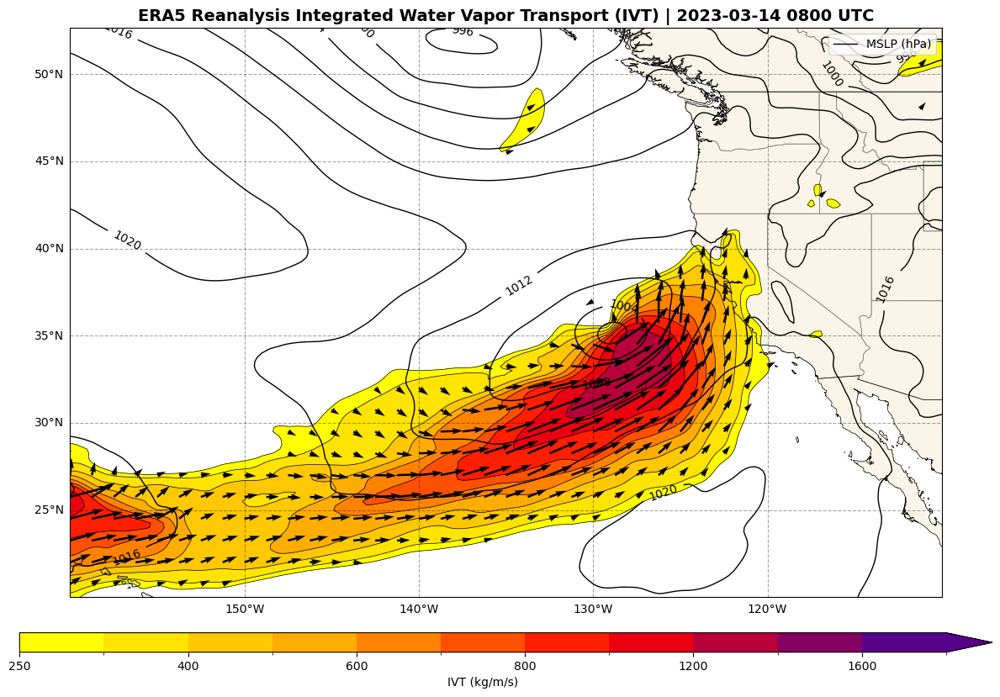

Time taken for iteration 8: 11.84 seconds


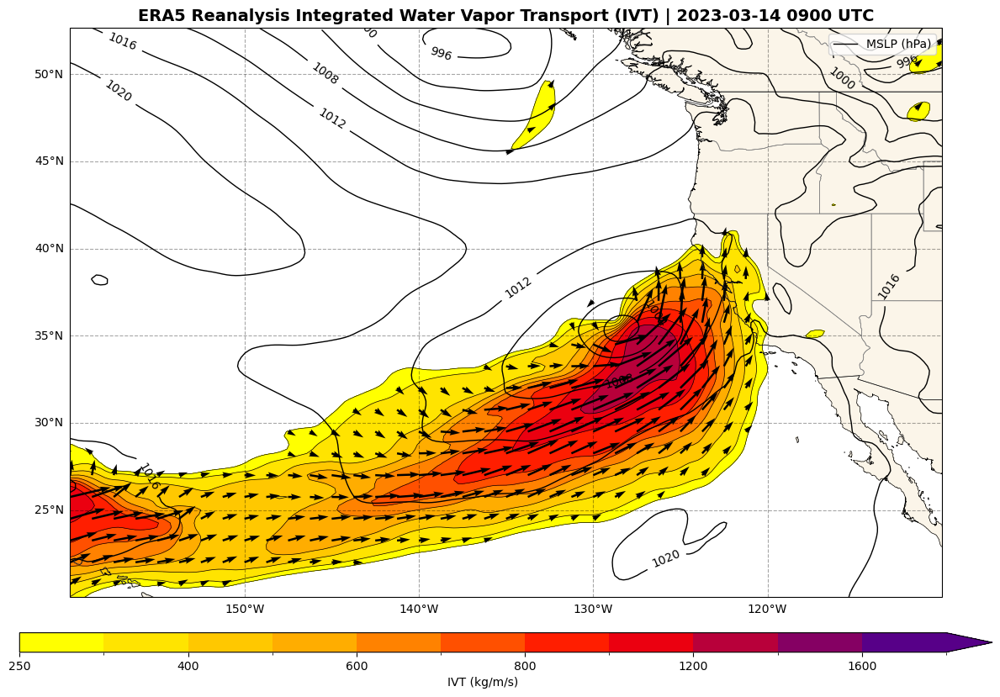

Time taken for iteration 9: 12.99 seconds


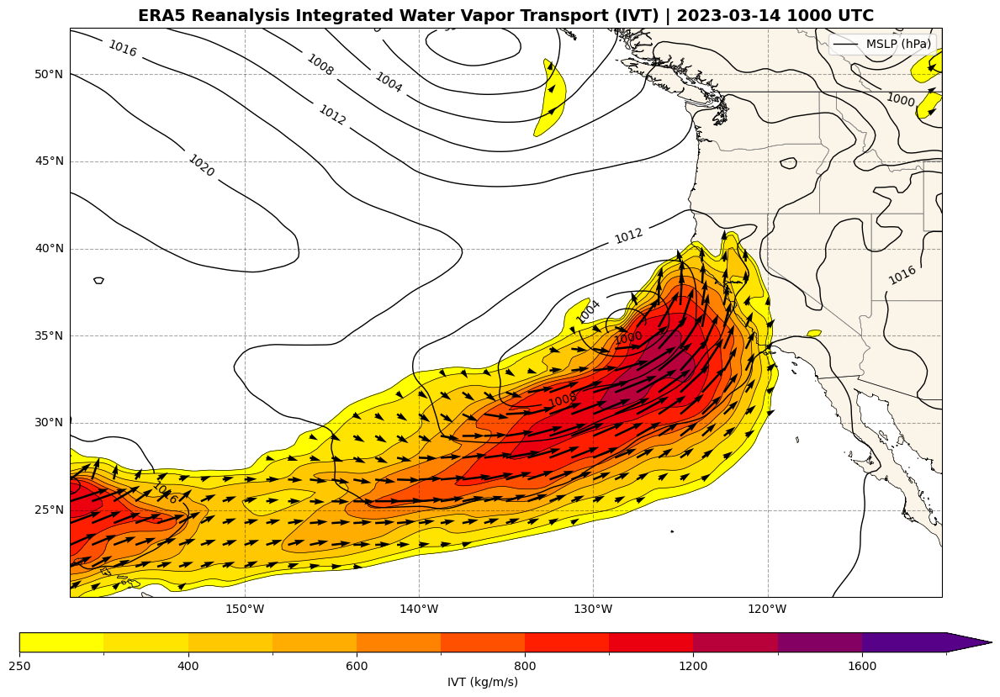

Time taken for iteration 10: 12.19 seconds


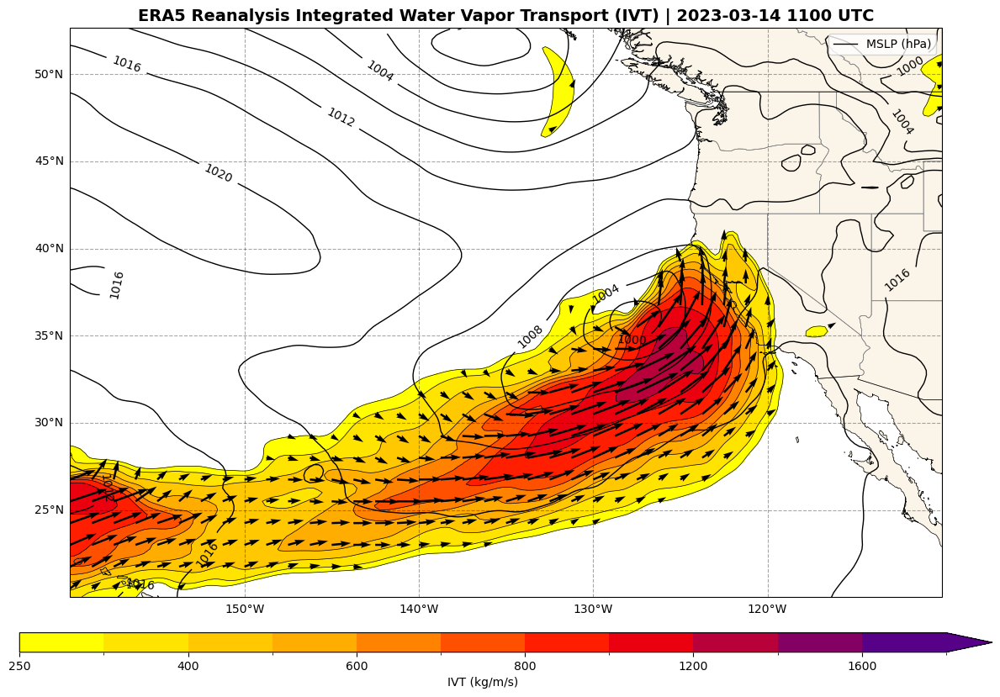

Time taken for iteration 11: 11.02 seconds


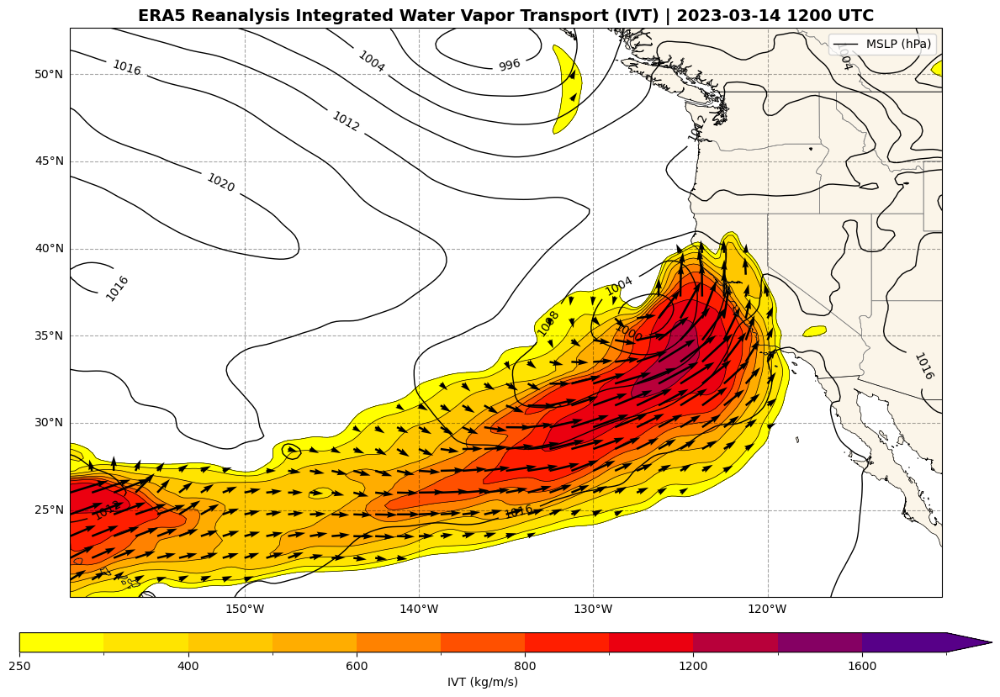

Time taken for iteration 12: 12.70 seconds


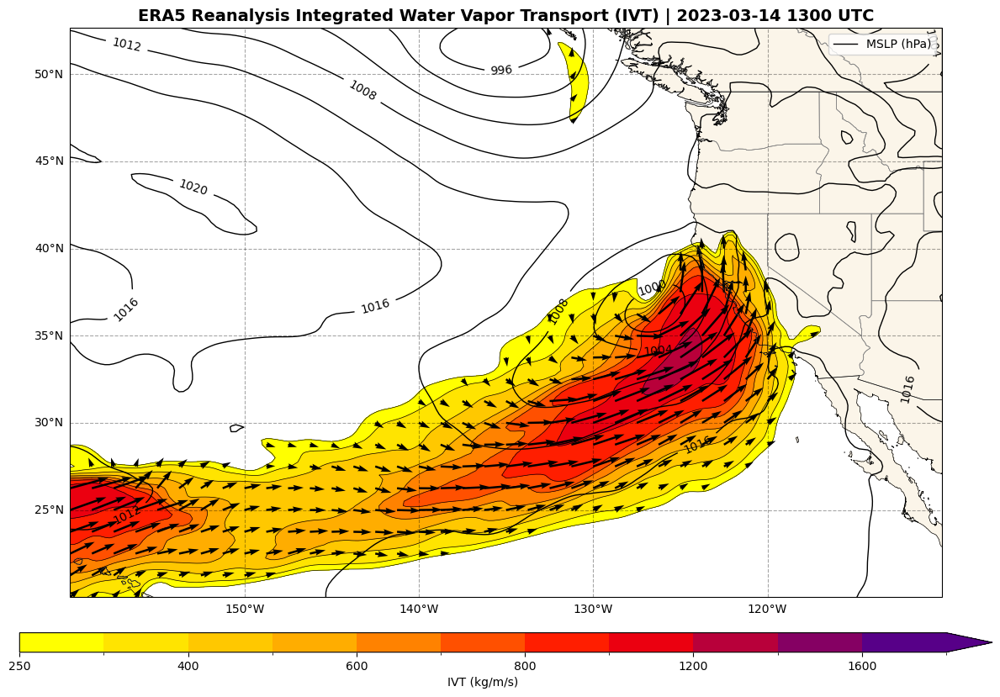

Time taken for iteration 13: 12.28 seconds


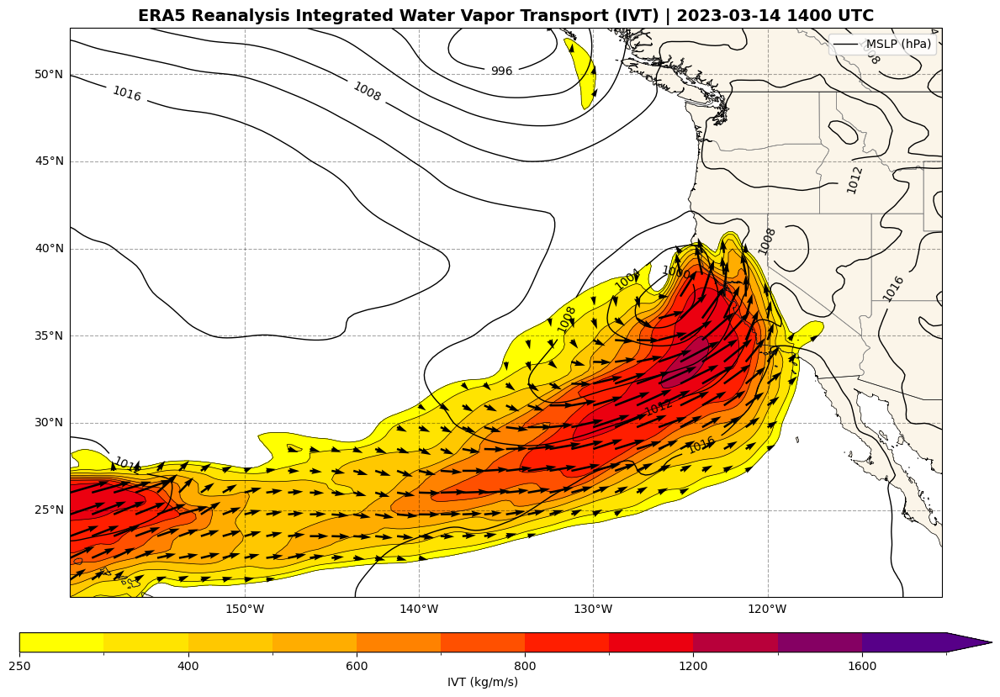

Time taken for iteration 14: 11.70 seconds


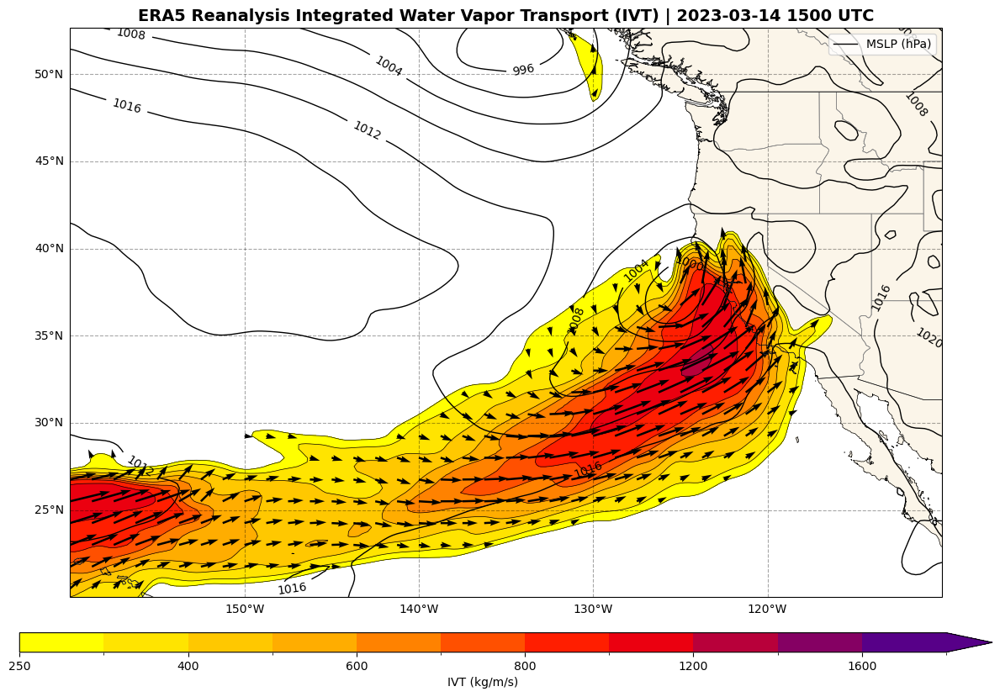

Time taken for iteration 15: 10.38 seconds


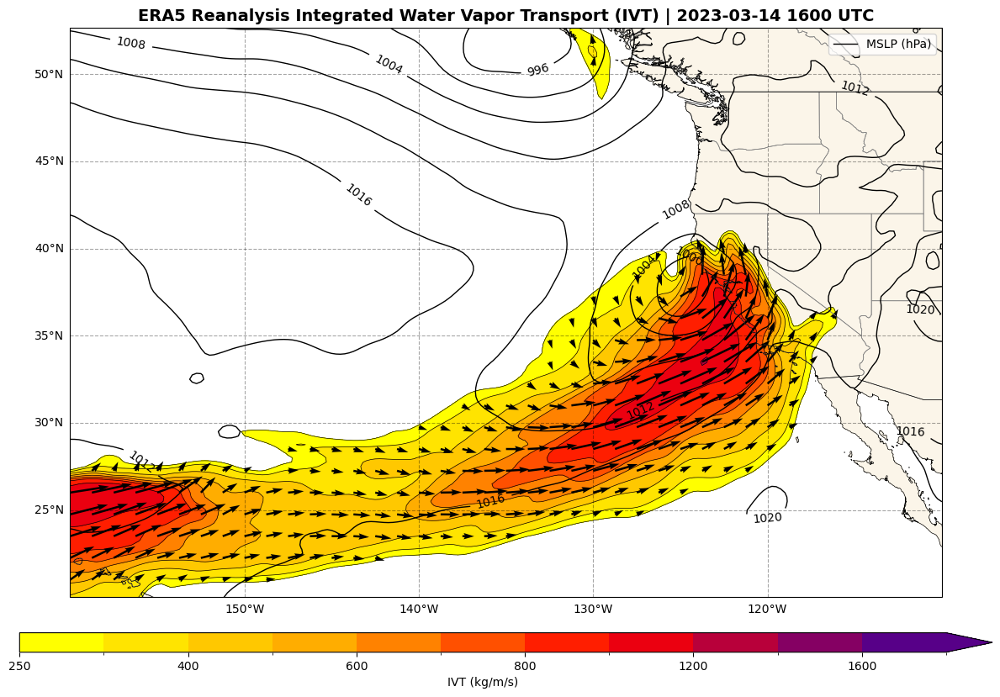

Time taken for iteration 16: 9.80 seconds


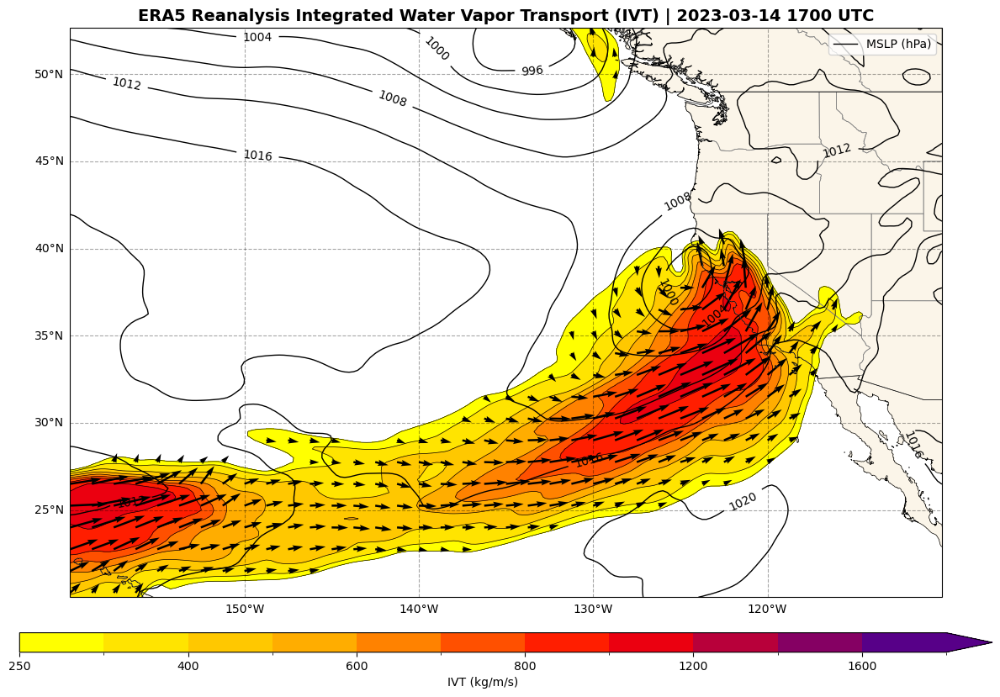

Time taken for iteration 17: 9.84 seconds


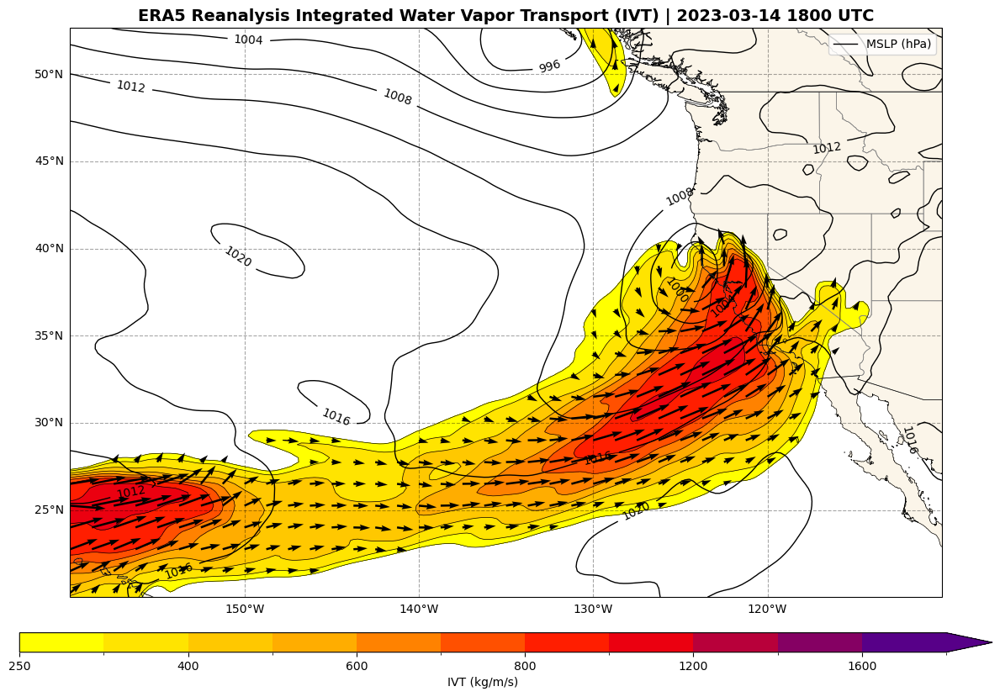

Time taken for iteration 18: 10.36 seconds


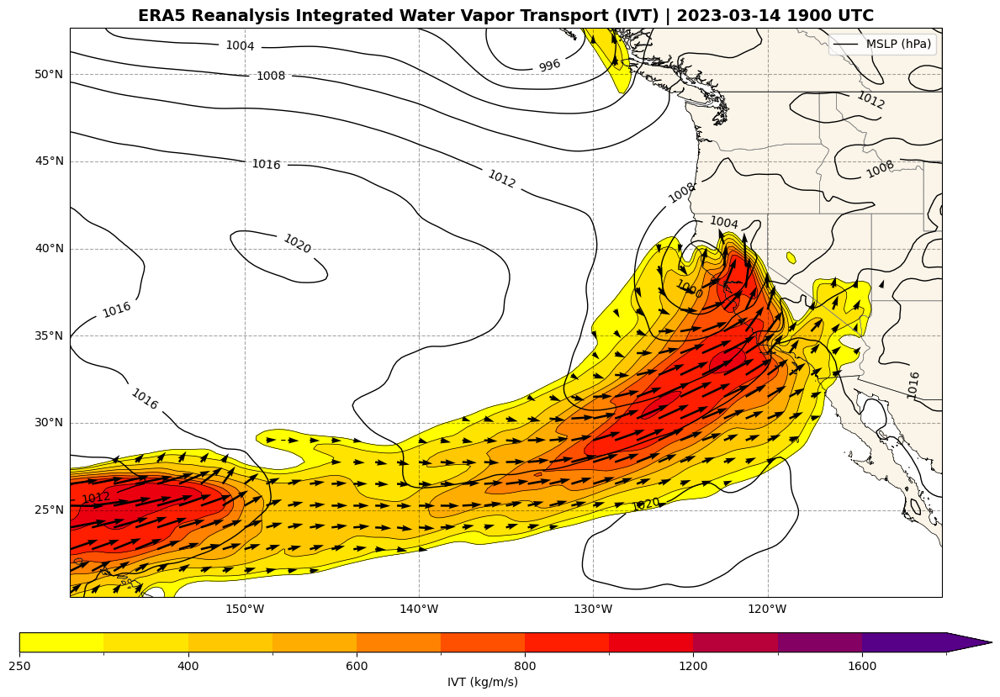

Time taken for iteration 19: 10.41 seconds


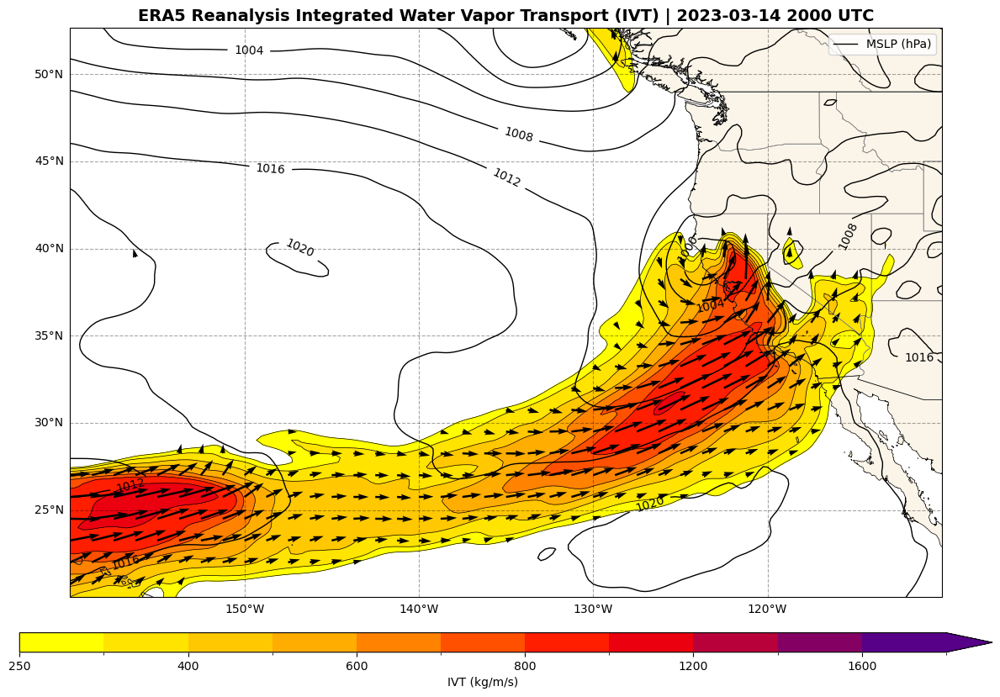

Time taken for iteration 20: 10.12 seconds


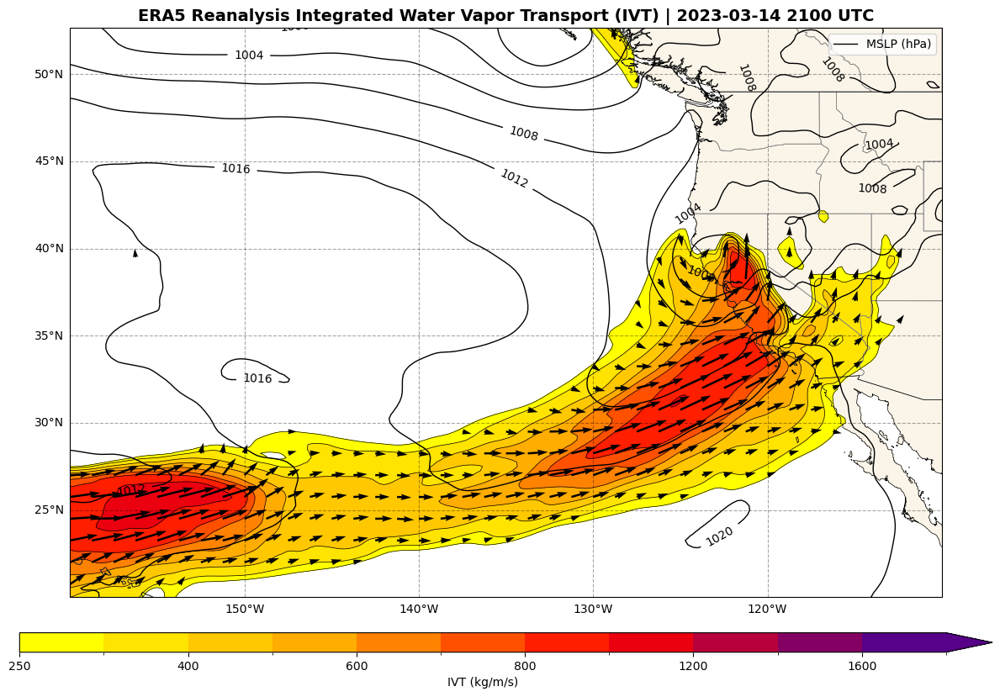

Time taken for iteration 21: 10.42 seconds


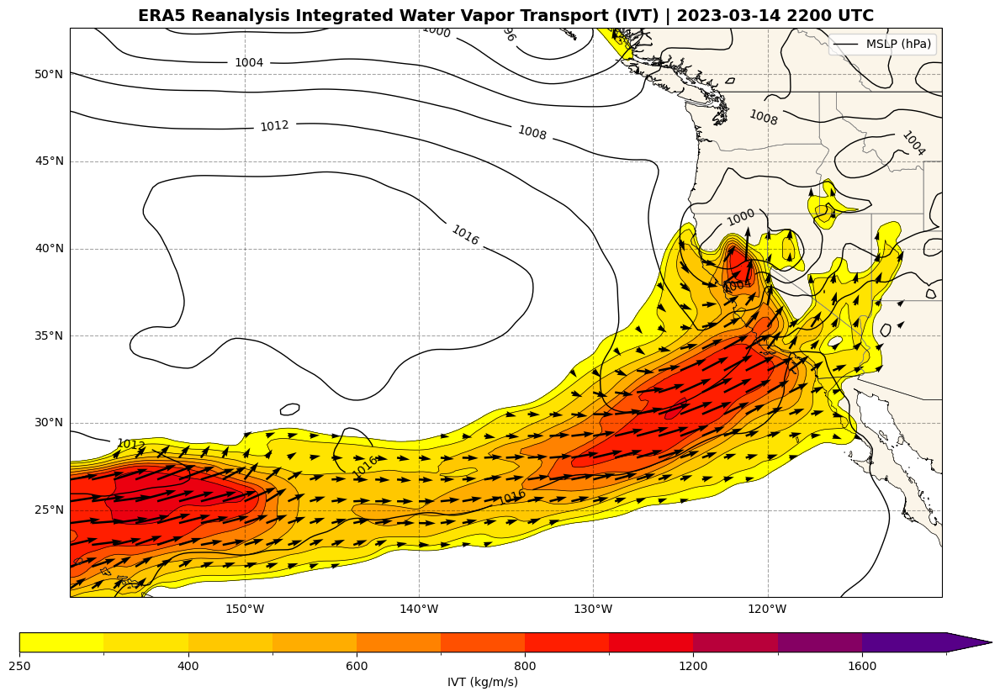

Time taken for iteration 22: 10.45 seconds


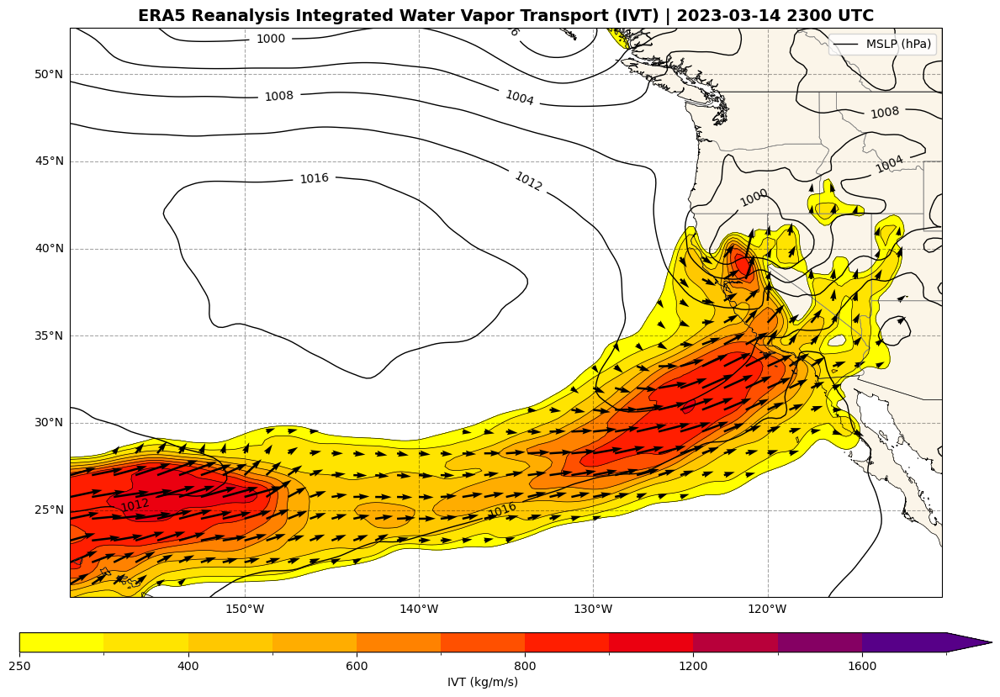

Time taken for iteration 23: 10.29 seconds
Plotted IVT successfully.
Script completed successfully.


In [9]:
if __name__ == '__main__':
    year = 2023
    month = 3
    first_day = 14
    last_day = first_day
    directions = {'North': 55, 
                'East': 250, 
                'South': 20, 
                'West': 200} # units: degrees North, degrees East
    start_point = (30, 360 - 134) # units: degrees North, degrees East
    end_point = (36, 360 - 127) # units: degrees North, degrees East
    g = 9.81 # units: m/s^2

    print("="*50)
    print("Loading datasets...")
    ds_pl, ds_sfc, ds_lsm = load_datasets(year=year, month=month, start_day=first_day, end_day=last_day, start_hour=0, end_hour=23)
    print("Datasets loaded successfully.")

    print("="*50)
    print("Plotting IVT...")
    plot_ivt(ds_pl=ds_pl, ds_sfc=ds_sfc, directions=directions, g=g, ds_lsm=ds_lsm)
    print("Plotted IVT successfully.")
    
    print("="*50)
    print("Script completed successfully.")
    print("="*50)